# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

In [2]:
import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

torch.set_default_tensor_type(torch.FloatTensor)

## Specify `Param` object

In [3]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.train import run as hmc_run
from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False

param = {
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 5.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
     'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})


param = Param(**param)
logger.log(repr(param))
logger.log(f'train_config: {train_config}')

DAYSTR = io.get_timestamp('%Y-%m-%d')
TSTAMP = io.get_timestamp('%Y-%m-%d-%H%M')
NOW = io.get_timestamp('%Y-%m-%d-%H%M%S')

PARAM_DIR = os.path.join(LOGS_DIR, param.uniquestr())
METRICS_DIR = os.path.join(PARAM_DIR, 'metrics')
MODEL_DIR = os.path.join(PARAM_DIR, 'models')
PLOTS_DIR = os.path.join(PARAM_DIR, 'plots')

io.check_else_make_dir(PARAM_DIR)
io.check_else_make_dir(MODEL_DIR)
io.check_else_make_dir(METRICS_DIR)
io.check_else_make_dir(PLOTS_DIR)

Duplicate key in file PosixPath('/home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 92 ('figure.facecolor: 474747')
Duplicate key in file PosixPath('/home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 93 ('figure.edgecolor: 0.50')
In /home/foremans/.config/matplotlib/stylelib/dark_jupyter.mplstyle: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.


TORCH DEVICE: cuda


[20:32:28]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

            train_config: TrainConfig(n_era=10, n_epoch=100, n_layers=24, n_s_nets=2,        
            hidden_sizes=[8, 8], kernel_size=5, base_lr=0.001, batch_size=256,               
            print_freq=100, plot_freq=100, with_force=False)

[20:32:28]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10

[20:32:28]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/models

[20:32:28]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/metrics

[20:32:28]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/plots

In [4]:
logger.log(PARAM_DIR)
logger.log(MODEL_DIR)
logger.log(METRICS_DIR)
logger.log(PLOTS_DIR)


[20:32:48]  /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10

            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/models

            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/metrics

            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/plots

## Specify directories for saving model, etc

In [8]:
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

hmc_metrics_dir = os.path.join(METRICS_DIR, 'hmc', TSTAMP)
outfile = os.path.join(hmc_metrics_dir, f'hmc_metrics.z')

io.save_history(metrics, outfile, name='hmc_metrics')

[17:18:06]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

            action=1.000 plaq=0.000 charge=0.000

            dt=0.008 traj=2 accept=True dH=-0.697 expdH=2.009 dq=0.000

            dt=0.008 traj=7 accept=True dH=0.179 expdH=0.836 dq=0.000

            dt=0.008 traj=12 accept=True dH=0.053 expdH=0.948 dq=0.000

            dt=0.008 traj=17 accept=True dH=-0.635 expdH=1.886 dq=0.000

            dt=0.008 traj=22 accept=False dH=1.002 expdH=0.367 dq=0.000

            dt=0.008 traj=27 accept=False dH=1.011 expdH=0.364 dq=0.000

            dt=0.008 traj=32 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.008 traj=37 accept=True dH=-0.021 expdH=1.021 dq=0.000

            dt=0.008 traj=42 accept=True dH=0.272 expdH=0.762 dq=0.000

            dt=0.008 traj=47 accept=True dH=0.358 expdH=0.699 dq=0.000

            dt=0.008 traj=52 accept=True dH=-0.313 expdH=1.368 dq=0.000

            dt=0.008 traj=57 accept=True dH=0.205 expdH=0.814 dq=0.000

[17:18:07]  dt=0.008 traj=62 accept=True dH=0.051 expdH=0.951 dq=0.000

            dt=0.008 traj=67 accept=False dH=0.277 expdH=0.758 dq=0.000

            dt=0.009 traj=72 accept=True dH=0.434 expdH=0.648 dq=0.000

            dt=0.008 traj=77 accept=True dH=0.025 expdH=0.976 dq=0.000

            dt=0.008 traj=82 accept=True dH=-0.113 expdH=1.120 dq=0.000

            dt=0.008 traj=87 accept=False dH=0.351 expdH=0.704 dq=0.000

            dt=0.008 traj=92 accept=True dH=0.101 expdH=0.904 dq=0.000

            dt=0.008 traj=97 accept=True dH=0.239 expdH=0.788 dq=0.000

            dt=0.008 traj=102 accept=True dH=0.285 expdH=0.752 dq=0.000

            dt=0.008 traj=107 accept=True dH=-0.060 expdH=1.061 dq=0.000

            dt=0.008 traj=112 accept=True dH=0.032 expdH=0.968 dq=0.000

            dt=0.008 traj=117 accept=True dH=0.266 expdH=0.766 dq=0.000

            dt=0.008 traj=122 accept=True dH=0.077 expdH=0.926 dq=0.000

            dt=0.008 traj=127 accept=True dH=-0.249 expdH=1.282 dq=0.000

            dt=0.008 traj=132 accept=True dH=0.238 expdH=0.788 dq=0.000

            dt=0.008 traj=137 accept=False dH=0.391 expdH=0.676 dq=0.000

            dt=0.008 traj=142 accept=True dH=-0.074 expdH=1.077 dq=0.000

            dt=0.008 traj=147 accept=True dH=-0.357 expdH=1.429 dq=0.000

            dt=0.008 traj=152 accept=True dH=0.422 expdH=0.656 dq=0.000

            dt=0.008 traj=157 accept=True dH=-0.073 expdH=1.076 dq=0.000

[17:18:08]  dt=0.008 traj=162 accept=True dH=0.319 expdH=0.727 dq=0.000

            dt=0.008 traj=167 accept=True dH=0.139 expdH=0.870 dq=0.000

            dt=0.008 traj=172 accept=True dH=0.091 expdH=0.913 dq=0.000

            dt=0.008 traj=177 accept=True dH=-0.567 expdH=1.763 dq=0.000

            dt=0.008 traj=182 accept=True dH=-0.574 expdH=1.775 dq=0.000

            dt=0.008 traj=187 accept=True dH=-0.163 expdH=1.177 dq=0.000

            dt=0.008 traj=192 accept=False dH=0.385 expdH=0.680 dq=0.000

            dt=0.008 traj=197 accept=True dH=-0.133 expdH=1.143 dq=0.000

            dt=0.008 traj=202 accept=True dH=0.352 expdH=0.703 dq=0.000

            dt=0.008 traj=207 accept=True dH=0.314 expdH=0.730 dq=0.000

            dt=0.008 traj=212 accept=True dH=0.480 expdH=0.619 dq=0.000

            dt=0.008 traj=217 accept=True dH=0.068 expdH=0.934 dq=0.000

            dt=0.008 traj=222 accept=True dH=-0.091 expdH=1.096 dq=0.000

            dt=0.008 traj=227 accept=False dH=0.308 expdH=0.735 dq=0.000

            dt=0.008 traj=232 accept=True dH=-0.131 expdH=1.140 dq=0.000

            dt=0.008 traj=237 accept=False dH=0.194 expdH=0.824 dq=0.000

            dt=0.008 traj=242 accept=True dH=0.096 expdH=0.908 dq=0.000

            dt=0.008 traj=247 accept=True dH=-0.394 expdH=1.483 dq=0.000

            dt=0.008 traj=252 accept=False dH=0.325 expdH=0.723 dq=0.000

            dt=0.008 traj=258 accept=True dH=0.144 expdH=0.866 dq=0.000

            dt=0.008 traj=263 accept=False dH=0.582 expdH=0.559 dq=0.000

[17:18:09]  dt=0.008 traj=268 accept=True dH=0.263 expdH=0.769 dq=0.000

            dt=0.008 traj=273 accept=False dH=0.154 expdH=0.858 dq=0.000

            dt=0.008 traj=278 accept=True dH=-0.338 expdH=1.402 dq=0.000

            dt=0.008 traj=283 accept=True dH=0.489 expdH=0.613 dq=0.000

            dt=0.008 traj=288 accept=True dH=0.463 expdH=0.629 dq=0.000

            dt=0.008 traj=293 accept=False dH=0.511 expdH=0.600 dq=0.000

            dt=0.008 traj=298 accept=True dH=0.277 expdH=0.758 dq=0.000

            dt=0.008 traj=303 accept=True dH=0.363 expdH=0.696 dq=0.000

            dt=0.008 traj=308 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.008 traj=313 accept=True dH=-0.198 expdH=1.219 dq=0.000

            dt=0.008 traj=318 accept=True dH=0.463 expdH=0.629 dq=0.000

            dt=0.008 traj=323 accept=False dH=0.258 expdH=0.772 dq=0.000

            dt=0.008 traj=328 accept=True dH=-0.064 expdH=1.066 dq=0.000

            dt=0.008 traj=333 accept=True dH=0.112 expdH=0.894 dq=0.000

            dt=0.008 traj=338 accept=True dH=0.498 expdH=0.608 dq=0.000

            dt=0.008 traj=343 accept=False dH=0.351 expdH=0.704 dq=0.000

            dt=0.008 traj=348 accept=False dH=0.437 expdH=0.646 dq=0.000

            dt=0.008 traj=353 accept=True dH=-0.107 expdH=1.113 dq=0.000

            dt=0.008 traj=358 accept=True dH=0.525 expdH=0.592 dq=0.000

            dt=0.008 traj=363 accept=True dH=0.389 expdH=0.678 dq=0.000

            dt=0.008 traj=368 accept=True dH=-0.268 expdH=1.308 dq=0.000

[17:18:10]  dt=0.008 traj=373 accept=True dH=-0.095 expdH=1.099 dq=0.000

            dt=0.008 traj=378 accept=True dH=0.009 expdH=0.991 dq=0.000

            dt=0.008 traj=383 accept=True dH=-0.099 expdH=1.104 dq=0.000

            dt=0.008 traj=388 accept=False dH=0.585 expdH=0.557 dq=0.000

            dt=0.008 traj=393 accept=True dH=-0.191 expdH=1.211 dq=0.000

            dt=0.008 traj=398 accept=True dH=-0.130 expdH=1.139 dq=0.000

            dt=0.008 traj=403 accept=True dH=0.228 expdH=0.797 dq=0.000

            dt=0.008 traj=408 accept=True dH=0.109 expdH=0.897 dq=0.000

            dt=0.008 traj=413 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.008 traj=418 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.008 traj=423 accept=False dH=0.585 expdH=0.557 dq=0.000

            dt=0.008 traj=428 accept=False dH=0.207 expdH=0.813 dq=0.000

            dt=0.008 traj=433 accept=True dH=-0.352 expdH=1.422 dq=0.000

            dt=0.008 traj=438 accept=True dH=-0.038 expdH=1.039 dq=0.000

            dt=0.008 traj=443 accept=True dH=-0.011 expdH=1.011 dq=0.000

            dt=0.008 traj=448 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.008 traj=453 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.008 traj=458 accept=True dH=-0.274 expdH=1.315 dq=0.000

            dt=0.008 traj=463 accept=True dH=0.453 expdH=0.636 dq=0.000

            dt=0.008 traj=468 accept=True dH=-0.397 expdH=1.488 dq=0.000

            dt=0.008 traj=473 accept=True dH=-0.098 expdH=1.103 dq=0.000

[17:18:11]  dt=0.008 traj=478 accept=True dH=0.317 expdH=0.728 dq=0.000

            dt=0.008 traj=483 accept=True dH=-0.401 expdH=1.493 dq=0.000

            dt=0.008 traj=488 accept=True dH=-0.132 expdH=1.141 dq=0.000

            dt=0.008 traj=493 accept=True dH=0.276 expdH=0.759 dq=0.000

            dt=0.008 traj=498 accept=True dH=-0.378 expdH=1.459 dq=0.000

            dt=0.008 traj=503 accept=True dH=-0.166 expdH=1.180 dq=0.000

            dt=0.008 traj=508 accept=True dH=0.554 expdH=0.574 dq=0.000

            dt=0.008 traj=514 accept=True dH=0.109 expdH=0.896 dq=0.000

            dt=0.008 traj=519 accept=True dH=0.134 expdH=0.875 dq=0.000

            dt=0.008 traj=524 accept=True dH=-0.177 expdH=1.194 dq=0.000

            dt=0.008 traj=529 accept=True dH=-0.362 expdH=1.437 dq=0.000

            dt=0.008 traj=534 accept=False dH=0.549 expdH=0.578 dq=0.000

            dt=0.008 traj=539 accept=False dH=0.400 expdH=0.670 dq=0.000

            dt=0.008 traj=544 accept=True dH=0.080 expdH=0.923 dq=0.000

            dt=0.008 traj=549 accept=True dH=0.175 expdH=0.840 dq=0.000

            dt=0.008 traj=554 accept=True dH=0.070 expdH=0.932 dq=0.000

            dt=0.008 traj=559 accept=True dH=-0.069 expdH=1.072 dq=0.000

            dt=0.008 traj=564 accept=False dH=0.341 expdH=0.711 dq=0.000

            dt=0.008 traj=569 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.008 traj=574 accept=True dH=-0.039 expdH=1.040 dq=1.000

            dt=0.008 traj=579 accept=True dH=-0.024 expdH=1.024 dq=0.000

[17:18:12]  dt=0.008 traj=584 accept=True dH=0.344 expdH=0.709 dq=0.000

            dt=0.008 traj=589 accept=True dH=0.054 expdH=0.947 dq=0.000

            dt=0.008 traj=594 accept=True dH=0.031 expdH=0.970 dq=0.000

            dt=0.008 traj=599 accept=True dH=0.473 expdH=0.623 dq=0.000

            dt=0.008 traj=604 accept=True dH=-0.109 expdH=1.115 dq=0.000

            dt=0.008 traj=609 accept=True dH=-0.328 expdH=1.388 dq=0.000

            dt=0.008 traj=614 accept=False dH=0.437 expdH=0.646 dq=0.000

            dt=0.008 traj=619 accept=True dH=-0.029 expdH=1.029 dq=0.000

            dt=0.008 traj=624 accept=True dH=0.277 expdH=0.758 dq=0.000

            dt=0.008 traj=629 accept=True dH=0.121 expdH=0.886 dq=0.000

            dt=0.008 traj=634 accept=True dH=0.082 expdH=0.921 dq=0.000

            dt=0.008 traj=639 accept=False dH=0.603 expdH=0.547 dq=0.000

            dt=0.008 traj=644 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.008 traj=649 accept=True dH=0.381 expdH=0.683 dq=0.000

            dt=0.008 traj=654 accept=True dH=0.216 expdH=0.806 dq=0.000

            dt=0.008 traj=659 accept=True dH=0.438 expdH=0.645 dq=0.000

            dt=0.008 traj=664 accept=True dH=-0.255 expdH=1.291 dq=0.000

            dt=0.008 traj=669 accept=False dH=0.092 expdH=0.912 dq=0.000

            dt=0.008 traj=674 accept=True dH=0.508 expdH=0.602 dq=0.000

            dt=0.008 traj=679 accept=True dH=-0.125 expdH=1.133 dq=0.000

            dt=0.008 traj=684 accept=True dH=0.350 expdH=0.705 dq=0.000

[17:18:13]  dt=0.008 traj=689 accept=True dH=-0.014 expdH=1.014 dq=0.000

            dt=0.008 traj=694 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.008 traj=699 accept=True dH=0.653 expdH=0.521 dq=0.000

            dt=0.008 traj=704 accept=True dH=0.139 expdH=0.870 dq=0.000

            dt=0.008 traj=709 accept=True dH=-0.030 expdH=1.031 dq=0.000

            dt=0.008 traj=714 accept=True dH=0.036 expdH=0.965 dq=0.000

            dt=0.008 traj=719 accept=True dH=0.466 expdH=0.628 dq=0.000

            dt=0.008 traj=724 accept=True dH=-0.281 expdH=1.325 dq=0.000

            dt=0.008 traj=729 accept=True dH=-0.109 expdH=1.115 dq=0.000

            dt=0.008 traj=734 accept=True dH=-0.517 expdH=1.678 dq=0.000

            dt=0.009 traj=739 accept=True dH=-0.353 expdH=1.423 dq=0.000

            dt=0.008 traj=744 accept=True dH=0.415 expdH=0.660 dq=0.000

            dt=0.008 traj=749 accept=True dH=-0.060 expdH=1.061 dq=0.000

            dt=0.008 traj=754 accept=True dH=-0.508 expdH=1.662 dq=0.000

            dt=0.008 traj=759 accept=True dH=-0.466 expdH=1.594 dq=0.000

            dt=0.008 traj=764 accept=True dH=0.178 expdH=0.837 dq=0.000

            dt=0.008 traj=770 accept=True dH=0.133 expdH=0.875 dq=0.000

            dt=0.008 traj=775 accept=False dH=0.257 expdH=0.773 dq=0.000

            dt=0.008 traj=780 accept=True dH=0.405 expdH=0.667 dq=0.000

            dt=0.008 traj=785 accept=True dH=0.050 expdH=0.951 dq=0.000

            dt=0.008 traj=790 accept=True dH=-0.235 expdH=1.264 dq=0.000

[17:18:14]  dt=0.008 traj=795 accept=False dH=0.104 expdH=0.902 dq=0.000

            dt=0.008 traj=800 accept=True dH=-0.286 expdH=1.331 dq=0.000

            dt=0.008 traj=805 accept=True dH=-0.469 expdH=1.598 dq=0.000

            dt=0.008 traj=810 accept=True dH=-0.103 expdH=1.109 dq=0.000

            dt=0.008 traj=815 accept=True dH=-0.299 expdH=1.348 dq=0.000

            dt=0.008 traj=820 accept=True dH=0.235 expdH=0.790 dq=0.000

            dt=0.008 traj=825 accept=True dH=-0.164 expdH=1.179 dq=0.000

            dt=0.008 traj=830 accept=True dH=0.267 expdH=0.766 dq=0.000

            dt=0.008 traj=835 accept=True dH=-0.109 expdH=1.115 dq=0.000

            dt=0.008 traj=840 accept=True dH=0.133 expdH=0.875 dq=0.000

            dt=0.008 traj=845 accept=True dH=-0.377 expdH=1.458 dq=0.000

            dt=0.008 traj=850 accept=True dH=-0.433 expdH=1.542 dq=0.000

            dt=0.008 traj=855 accept=True dH=-0.172 expdH=1.188 dq=0.000

            dt=0.008 traj=860 accept=True dH=-0.136 expdH=1.145 dq=0.000

            dt=0.008 traj=865 accept=False dH=0.949 expdH=0.387 dq=0.000

            dt=0.008 traj=870 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.008 traj=875 accept=True dH=-0.293 expdH=1.341 dq=0.000

            dt=0.008 traj=880 accept=True dH=-0.054 expdH=1.055 dq=0.000

            dt=0.008 traj=885 accept=True dH=0.433 expdH=0.648 dq=0.000

            dt=0.008 traj=890 accept=True dH=-0.293 expdH=1.341 dq=0.000

            dt=0.009 traj=895 accept=True dH=-0.022 expdH=1.022 dq=0.000

[17:18:15]  dt=0.008 traj=900 accept=True dH=-0.286 expdH=1.331 dq=0.000

            dt=0.008 traj=905 accept=True dH=0.310 expdH=0.734 dq=0.000

            dt=0.009 traj=910 accept=True dH=0.175 expdH=0.840 dq=0.000

            dt=0.008 traj=915 accept=True dH=-0.539 expdH=1.714 dq=0.000

            dt=0.008 traj=920 accept=True dH=0.239 expdH=0.787 dq=0.000

            dt=0.008 traj=925 accept=False dH=0.816 expdH=0.442 dq=0.000

            dt=0.008 traj=930 accept=True dH=-0.267 expdH=1.306 dq=0.000

            dt=0.008 traj=935 accept=True dH=0.706 expdH=0.493 dq=0.000

            dt=0.008 traj=940 accept=True dH=0.188 expdH=0.829 dq=0.000

            dt=0.008 traj=945 accept=True dH=-0.456 expdH=1.577 dq=0.000

            dt=0.008 traj=950 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.008 traj=955 accept=True dH=0.542 expdH=0.582 dq=0.000

            dt=0.008 traj=960 accept=True dH=0.174 expdH=0.840 dq=0.000

            dt=0.008 traj=965 accept=True dH=-0.119 expdH=1.126 dq=0.000

            dt=0.008 traj=970 accept=True dH=-0.232 expdH=1.261 dq=0.000

            dt=0.008 traj=975 accept=True dH=0.119 expdH=0.888 dq=0.000

            dt=0.008 traj=980 accept=True dH=0.369 expdH=0.691 dq=0.000

            dt=0.008 traj=985 accept=True dH=-0.203 expdH=1.225 dq=0.000

            dt=0.008 traj=990 accept=True dH=-0.026 expdH=1.027 dq=0.000

            dt=0.008 traj=995 accept=True dH=0.224 expdH=0.799 dq=0.000

[17:18:16]  dt=0.008 traj=1000 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.008 traj=1005 accept=False dH=1.126 expdH=0.324 dq=0.000

            dt=0.008 traj=1010 accept=False dH=0.434 expdH=0.648 dq=0.000

            dt=0.008 traj=1015 accept=True dH=-0.297 expdH=1.345 dq=0.000

            dt=0.008 traj=1020 accept=False dH=0.500 expdH=0.606 dq=0.000

            dt=0.008 traj=1026 accept=True dH=-0.286 expdH=1.331 dq=0.000

            dt=0.008 traj=1031 accept=False dH=0.248 expdH=0.780 dq=0.000

            dt=0.008 traj=1036 accept=False dH=0.225 expdH=0.798 dq=0.000

            dt=0.008 traj=1041 accept=True dH=0.119 expdH=0.888 dq=0.000

            dt=0.008 traj=1046 accept=False dH=0.486 expdH=0.615 dq=0.000

            dt=0.008 traj=1051 accept=True dH=0.171 expdH=0.843 dq=0.000

            dt=0.008 traj=1056 accept=True dH=-0.069 expdH=1.072 dq=0.000

            dt=0.008 traj=1061 accept=False dH=0.652 expdH=0.521 dq=0.000

            dt=0.008 traj=1066 accept=False dH=0.323 expdH=0.724 dq=0.000

            dt=0.008 traj=1071 accept=True dH=0.204 expdH=0.816 dq=0.000

            dt=0.008 traj=1076 accept=True dH=-0.369 expdH=1.447 dq=0.000

            dt=0.008 traj=1081 accept=True dH=0.083 expdH=0.920 dq=0.000

            dt=0.008 traj=1086 accept=True dH=-0.301 expdH=1.351 dq=0.000

            dt=0.008 traj=1091 accept=True dH=-0.106 expdH=1.111 dq=0.000

            dt=0.008 traj=1096 accept=True dH=0.261 expdH=0.770 dq=0.000

            dt=0.008 traj=1101 accept=True dH=-0.113 expdH=1.119 dq=0.000

[17:18:17]  dt=0.008 traj=1106 accept=True dH=0.352 expdH=0.704 dq=0.000

            dt=0.008 traj=1111 accept=True dH=0.032 expdH=0.969 dq=0.000

            dt=0.008 traj=1116 accept=True dH=0.312 expdH=0.732 dq=0.000

            dt=0.008 traj=1121 accept=True dH=-0.071 expdH=1.074 dq=0.000

            dt=0.008 traj=1126 accept=True dH=-0.287 expdH=1.332 dq=0.000

            dt=0.008 traj=1131 accept=True dH=-0.205 expdH=1.228 dq=0.000

            dt=0.008 traj=1136 accept=True dH=-0.276 expdH=1.318 dq=0.000

            dt=0.008 traj=1141 accept=True dH=-0.110 expdH=1.116 dq=0.000

            dt=0.008 traj=1146 accept=True dH=-0.169 expdH=1.184 dq=0.000

            dt=0.008 traj=1151 accept=True dH=-0.181 expdH=1.198 dq=0.000

            dt=0.008 traj=1156 accept=True dH=-0.119 expdH=1.127 dq=0.000

            dt=0.008 traj=1161 accept=True dH=0.135 expdH=0.874 dq=0.000

            dt=0.008 traj=1166 accept=True dH=-0.056 expdH=1.058 dq=0.000

            dt=0.009 traj=1171 accept=True dH=-0.370 expdH=1.447 dq=0.000

            dt=0.008 traj=1176 accept=True dH=-0.096 expdH=1.101 dq=0.000

            dt=0.008 traj=1181 accept=False dH=0.344 expdH=0.709 dq=0.000

            dt=0.008 traj=1186 accept=True dH=0.151 expdH=0.860 dq=0.000

            dt=0.008 traj=1191 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.008 traj=1196 accept=True dH=-0.122 expdH=1.130 dq=0.000

            dt=0.008 traj=1201 accept=True dH=0.029 expdH=0.971 dq=0.000

            dt=0.008 traj=1206 accept=True dH=0.076 expdH=0.927 dq=0.000

[17:18:18]  dt=0.008 traj=1211 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.008 traj=1216 accept=True dH=0.213 expdH=0.808 dq=0.000

            dt=0.008 traj=1221 accept=True dH=-0.164 expdH=1.178 dq=0.000

            dt=0.008 traj=1226 accept=True dH=-0.253 expdH=1.288 dq=0.000

            dt=0.008 traj=1231 accept=True dH=0.234 expdH=0.792 dq=0.000

            dt=0.008 traj=1236 accept=True dH=0.116 expdH=0.891 dq=0.000

            dt=0.008 traj=1241 accept=True dH=-0.159 expdH=1.172 dq=0.000

            dt=0.008 traj=1246 accept=True dH=0.377 expdH=0.686 dq=0.000

            dt=0.008 traj=1251 accept=True dH=-0.158 expdH=1.172 dq=0.000

            dt=0.008 traj=1256 accept=False dH=0.856 expdH=0.425 dq=0.000

            dt=0.009 traj=1261 accept=False dH=0.669 expdH=0.512 dq=0.000

            dt=0.008 traj=1266 accept=True dH=-0.492 expdH=1.636 dq=0.000

            dt=0.008 traj=1271 accept=True dH=-0.141 expdH=1.151 dq=0.000

            dt=0.008 traj=1276 accept=True dH=0.055 expdH=0.947 dq=0.000

            Run times: [0.007848, 2.444963, 0.007553, 2.445409, 0.00791, 2.440575, 0.008016, 
            2.449218, 0.007836, 2.456044]

            Per trajectory: [3.1e-05, 0.009551, 3e-05, 0.009552, 3.1e-05, 0.009533, 3.1e-05, 
            0.009567, 3.1e-05, 0.009594]

[17:18:18]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/metrics/hmc/2021-06-08-1717

[17:18:18]  Saving hmc_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t8x8_b5.0_n256_t1.0_s10/metrics/hmc/2021-06-08-1717/hmc_metrics.z.

## Specify `TrainConfig` object for training our model

Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

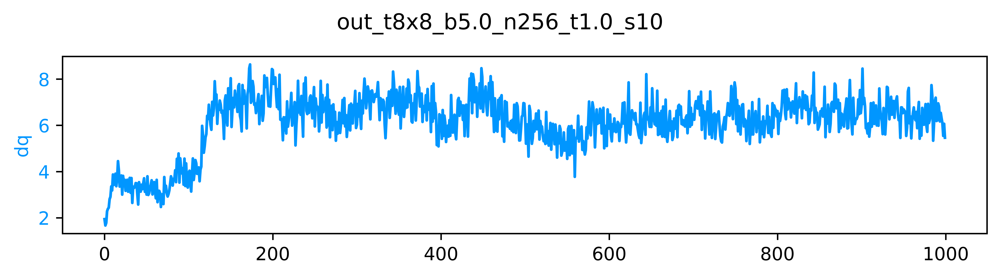

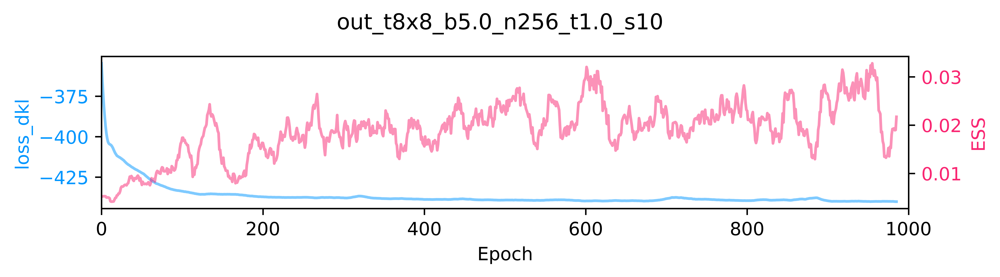

[17:18:30]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:18:45]  epoch=97.000 step=0.000 dt=0.148 loss=-432.875 dq=3.79297 ess=0.0114911          
            plaq=0.838111 loss_dkl=-432.875 logp=268.196 logq=-164.679

[17:18:47]  ---------------------------------------                                          
            ERA=1, last took: 0 min 16.8 s                                                   
            ---------------------------------------

[17:19:02]  epoch=97.000 step=97.000 dt=0.148 loss=-437.006 dq=7.37266 ess=0.0191142         
            plaq=0.858543 loss_dkl=-437.006 logp=274.734 logq=-162.273

[17:19:04]  ---------------------------------------                                          
            ERA=2, last took: 0 min 16.85 s                                                  
            ---------------------------------------

[17:19:19]  epoch=97.000 step=194.000 dt=0.148 loss=-437.43 dq=6.64844 ess=0.0173462         
            plaq=0.861101 loss_dkl=-437.43 logp=275.552 logq=-161.878

[17:19:21]  ---------------------------------------                                          
            ERA=3, last took: 0 min 16.84 s                                                  
            ---------------------------------------

[17:19:36]  epoch=97.000 step=291.000 dt=0.149 loss=-438.512 dq=5.69844 ess=0.0254863        
            plaq=0.861704 loss_dkl=-438.512 logp=275.745 logq=-162.767

[17:19:38]  ---------------------------------------                                          
            ERA=4, last took: 0 min 16.89 s                                                  
            ---------------------------------------

[17:19:53]  epoch=97.000 step=388.000 dt=0.149 loss=-439.32 dq=6.50703 ess=0.0161076         
            plaq=0.869243 loss_dkl=-439.32 logp=278.158 logq=-161.163

[17:19:55]  ---------------------------------------                                          
            ERA=5, last took: 0 min 16.9 s                                                   
            ---------------------------------------

[17:20:10]  epoch=97.000 step=485.000 dt=0.149 loss=-439.463 dq=5.96172 ess=0.0123944        
            plaq=0.863044 loss_dkl=-439.463 logp=276.174 logq=-163.289

[17:20:12]  ---------------------------------------                                          
            ERA=6, last took: 0 min 16.95 s                                                  
            ---------------------------------------

[17:20:27]  epoch=97.000 step=582.000 dt=0.149 loss=-439.392 dq=6.53516 ess=0.0229467        
            plaq=0.864344 loss_dkl=-439.392 logp=276.59 logq=-162.802

[17:20:29]  ---------------------------------------                                          
            ERA=7, last took: 0 min 16.98 s                                                  
            ---------------------------------------

[17:20:44]  epoch=97.000 step=679.000 dt=0.149 loss=-439.452 dq=6.50313 ess=0.0254732        
            plaq=0.866073 loss_dkl=-439.452 logp=277.143 logq=-162.309

[17:20:46]  ---------------------------------------                                          
            ERA=8, last took: 0 min 16.99 s                                                  
            ---------------------------------------

[17:21:01]  epoch=97.000 step=776.000 dt=0.149 loss=-438.559 dq=6.80703 ess=0.0191314        
            plaq=0.859012 loss_dkl=-438.559 logp=274.884 logq=-163.675

[17:21:03]  ---------------------------------------                                          
            ERA=9, last took: 0 min 17 s                                                     
            ---------------------------------------

[17:21:18]  epoch=97.000 step=873.000 dt=0.150 loss=-440.287 dq=5.89453 ess=0.0197236        
            plaq=0.868438 loss_dkl=-440.287 logp=277.9 logq=-162.387

[17:21:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1717

[17:21:20]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t8x8_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1717/pre_flow_m
            odel.tar

[17:21:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717

[17:21:20]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/loss_d
            kl_ess_training.pdf

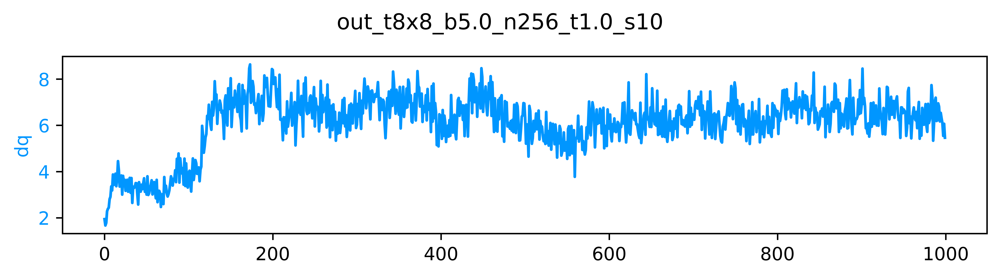

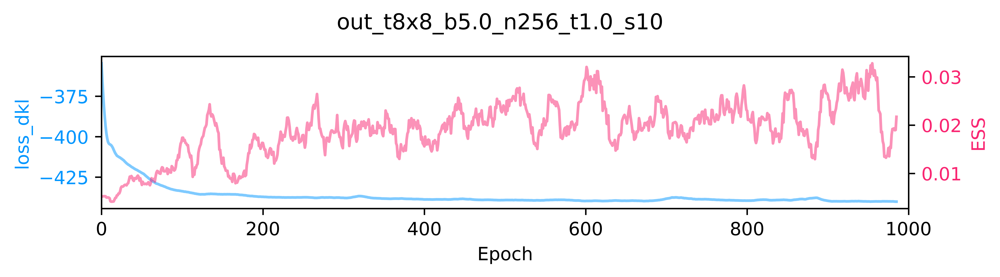

In [9]:
train_outputs = train(param,
                      train_config,
                      #model=train_outputs['model'],
                      pre_model=None,
                      logger=logger,
                      figsize=(7.5, 2))
 
pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']

pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer_kdl']

step = train_config.n_era * train_config.n_epoch
outfile = os.path.join(MODEL_DIR, 'pre_flow_model', TSTAMP, 'pre_flow_model.tar')

io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=train_outputs['model']['layers'],
    optimizer=pre_flow_optimizer,
    history=train_outputs['history'],
    overwrite=True,
)

plots = train_outputs['plots']
outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)

save_live_plots(plots, outdir)

[17:22:21]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-172221

[17:22:21]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1717

[17:22:21]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/step.p
            df

[17:22:22]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/dt.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/loss.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/dq.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/ess.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/plaq.p
            df

[17:22:23]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/loss_d
            kl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/logp.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1717/logq.p
            df

[17:22:23]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t8x8_b5.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-171
            7/train_metrics.z.

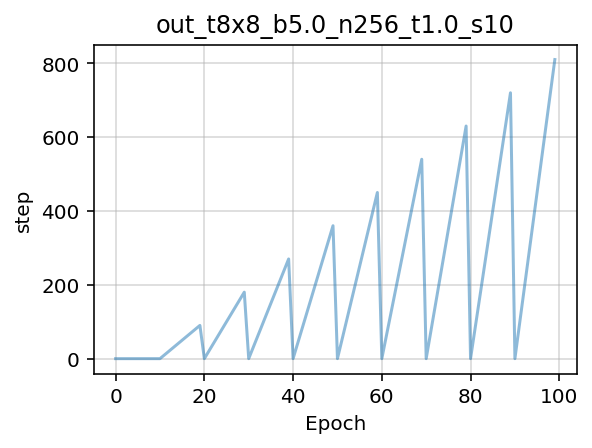

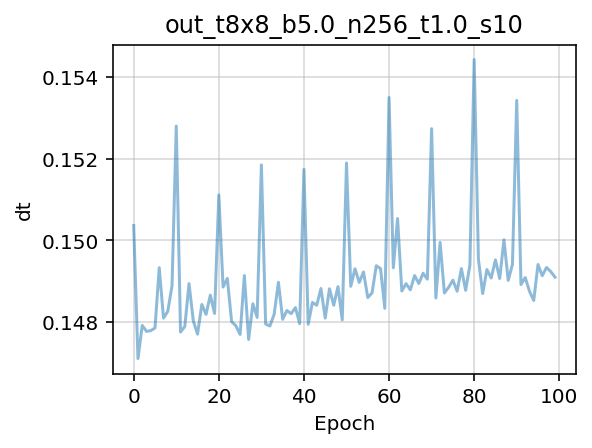

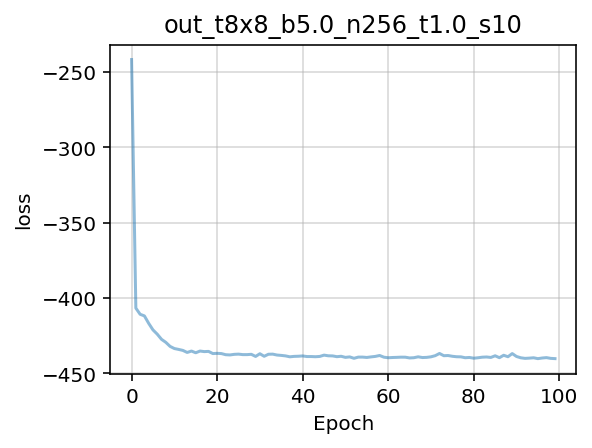

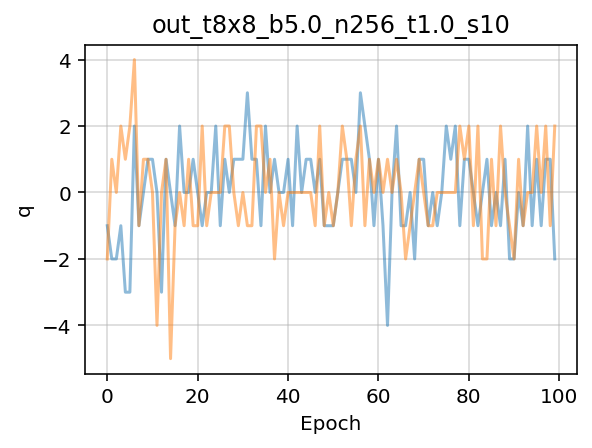

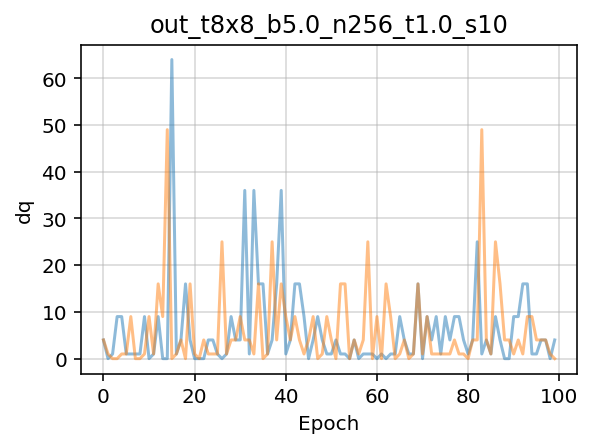

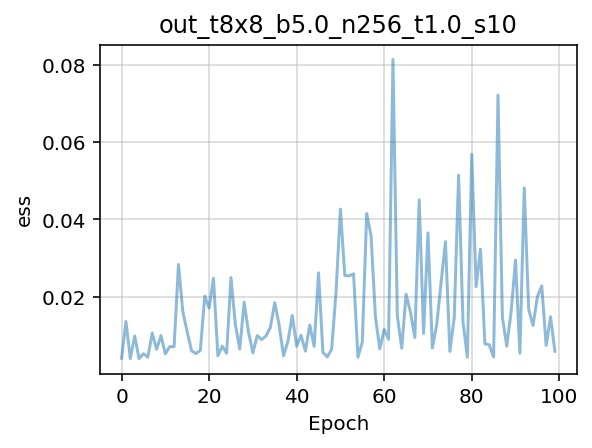

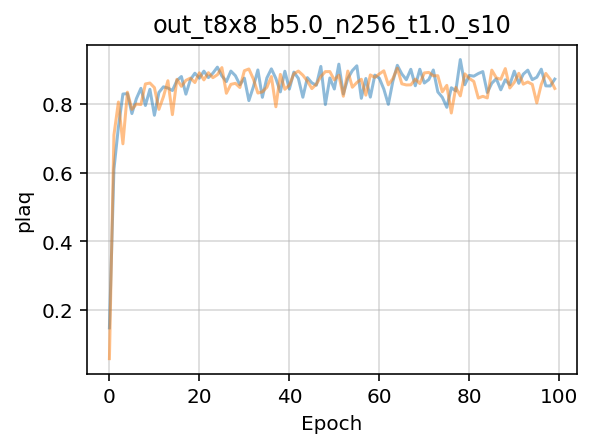

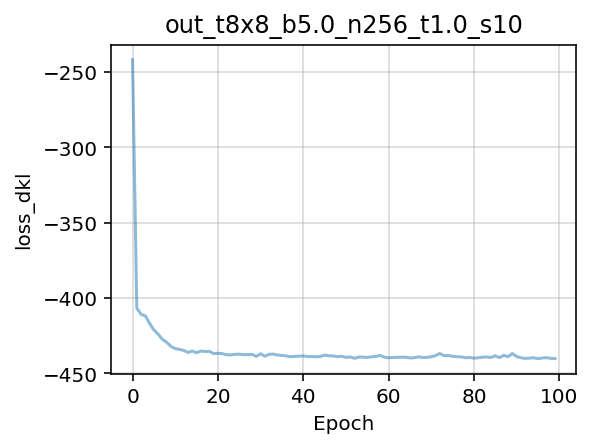

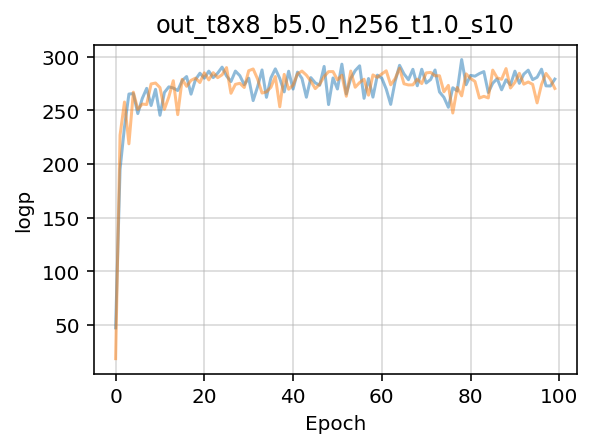

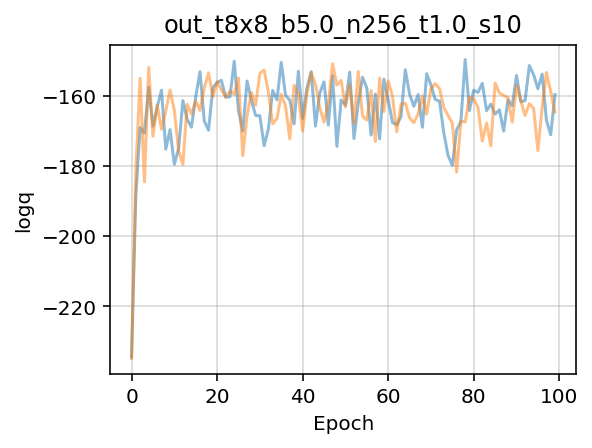

In [10]:
from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

## Run inference on trained model and plot history

[17:23:30]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717

[17:23:30]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/ inference/pre_flow_model/2021-06-08-1717

[17:23:30]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/ess.p
            df

[17:23:31]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/dqsq.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/dkl.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/logq.
            pdf

[17:23:32]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/logp.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1717/accep
            ted.pdf

[17:23:32]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/plots/                                    
            inference/pre_flow_model/2021-06-08-1717/inference_metrics.z.

[17:23:37]  Accept rate: 0.0306

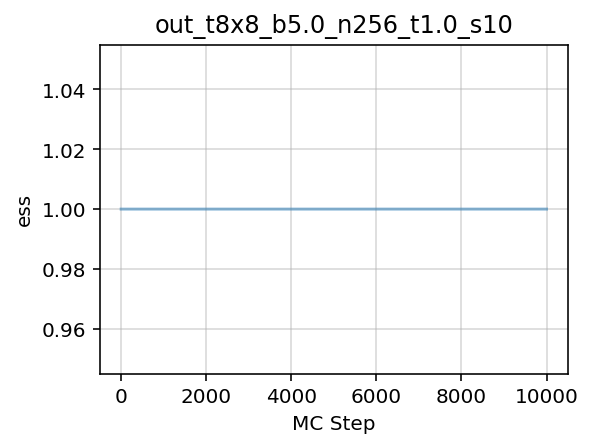

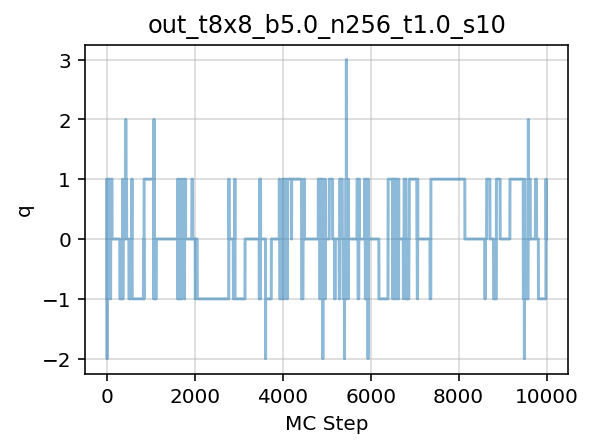

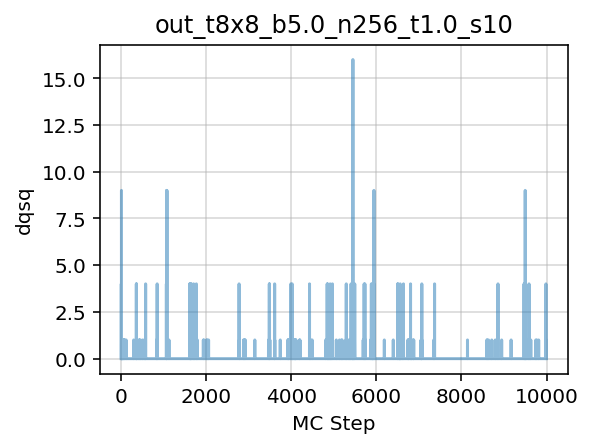

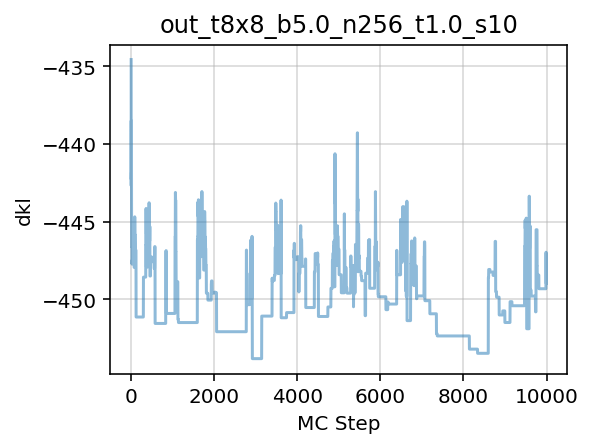

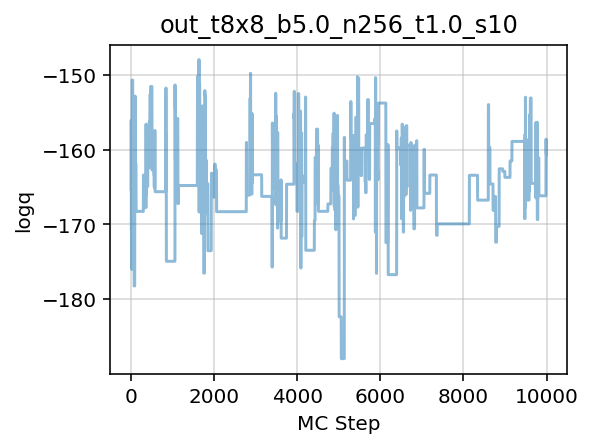

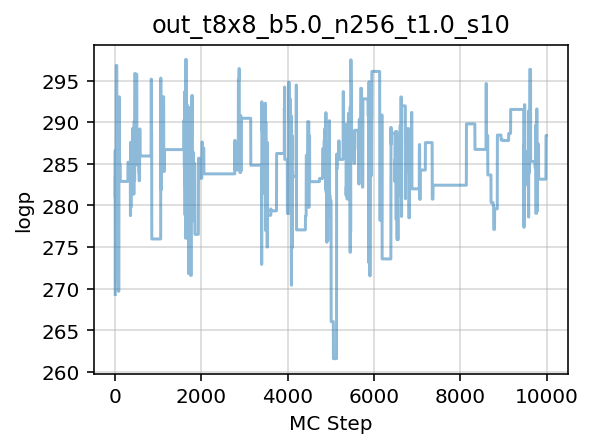

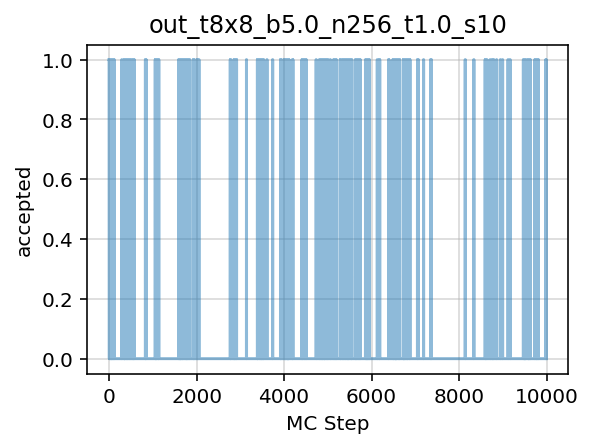

In [11]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=10000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [12]:
np.mean(history['accepted'])

0.0306

In [14]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)
u1_ens = outputs['history']

pre_flow = pre_flow_model['layers']

[17:25:48]  accept_rate=0.05078125

            top_susceptibility=0.56062 +/- 0.05912

In [15]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

[17:26:48]  accept_rate=0.0595703125

            top_susceptibility=0.62585 +/- 0.07211

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

## Try continuing training on previous model

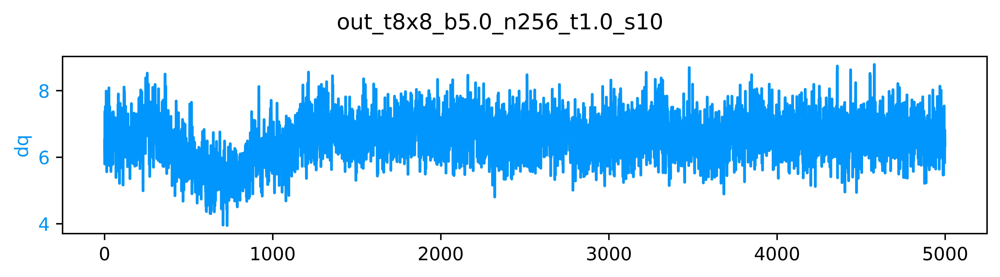

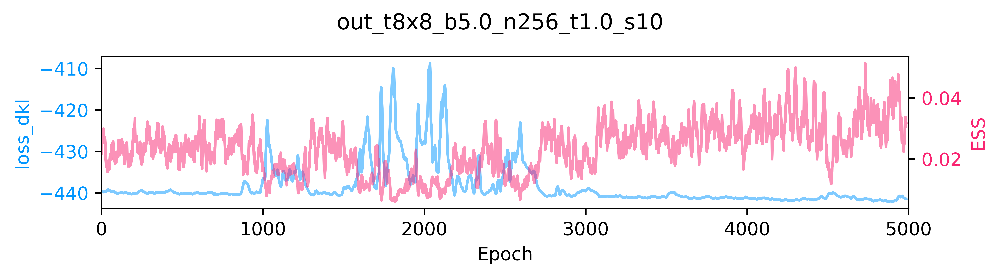

[17:29:17]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:29:32]  epoch=97.000 step=0.000 dt=0.148 loss=-440.21 dq=6.37266 ess=0.02206             
            plaq=0.867213 loss_dkl=-440.21 logp=277.508 logq=-162.702

[17:29:34]  ---------------------------------------                                          
            ERA=1, last took: 0 min 16.81 s                                                  
            ---------------------------------------

[17:29:49]  epoch=97.000 step=97.000 dt=0.148 loss=-440.219 dq=6.47578 ess=0.014922          
            plaq=0.868675 loss_dkl=-440.219 logp=277.976 logq=-162.243

[17:29:51]  ---------------------------------------                                          
            ERA=2, last took: 0 min 16.79 s                                                  
            ---------------------------------------

[17:30:06]  epoch=97.000 step=194.000 dt=0.148 loss=-440.112 dq=7.33047 ess=0.0351443        
            plaq=0.866342 loss_dkl=-440.112 logp=277.229 logq=-162.882

[17:30:08]  ---------------------------------------                                          
            ERA=3, last took: 0 min 16.81 s                                                  
            ---------------------------------------

[17:30:23]  epoch=97.000 step=291.000 dt=0.148 loss=-439.715 dq=6.43437 ess=0.0148582        
            plaq=0.869046 loss_dkl=-439.715 logp=278.095 logq=-161.621

[17:30:25]  ---------------------------------------                                          
            ERA=4, last took: 0 min 16.91 s                                                  
            ---------------------------------------

[17:30:40]  epoch=97.000 step=388.000 dt=0.150 loss=-440.166 dq=5.76484 ess=0.0176124        
            plaq=0.866674 loss_dkl=-440.166 logp=277.336 logq=-162.83

[17:30:42]  ---------------------------------------                                          
            ERA=5, last took: 0 min 17.16 s                                                  
            ---------------------------------------

[17:30:57]  epoch=97.000 step=485.000 dt=0.148 loss=-440.049 dq=5.80391 ess=0.0280993        
            plaq=0.866376 loss_dkl=-440.049 logp=277.24 logq=-162.809

[17:30:59]  ---------------------------------------                                          
            ERA=6, last took: 0 min 16.88 s                                                  
            ---------------------------------------

[17:31:14]  epoch=97.000 step=582.000 dt=0.148 loss=-440.38 dq=5.50313 ess=0.0240229         
            plaq=0.868671 loss_dkl=-440.38 logp=277.975 logq=-162.406

[17:31:16]  ---------------------------------------                                          
            ERA=7, last took: 0 min 16.85 s                                                  
            ---------------------------------------

[17:31:31]  epoch=97.000 step=679.000 dt=0.148 loss=-440.364 dq=5.33125 ess=0.0129042        
            plaq=0.868092 loss_dkl=-440.364 logp=277.79 logq=-162.575

[17:31:33]  ---------------------------------------                                          
            ERA=8, last took: 0 min 16.87 s                                                  
            ---------------------------------------

[17:31:47]  epoch=97.000 step=776.000 dt=0.148 loss=-437.158 dq=6.50938 ess=0.0209392        
            plaq=0.86537 loss_dkl=-437.158 logp=276.918 logq=-160.24

[17:31:49]  ---------------------------------------                                          
            ERA=9, last took: 0 min 16.93 s                                                  
            ---------------------------------------

[17:32:04]  epoch=97.000 step=873.000 dt=0.148 loss=-439.108 dq=6.04375 ess=0.024002         
            plaq=0.869625 loss_dkl=-439.108 logp=278.28 logq=-160.828

[17:32:06]  ---------------------------------------                                          
            ERA=10, last took: 0 min 16.91 s                                                 
            ---------------------------------------

[17:32:21]  epoch=97.000 step=970.000 dt=0.149 loss=-433.177 dq=6.10469 ess=0.0175073        
            plaq=0.869821 loss_dkl=-433.177 logp=278.343 logq=-154.835

[17:32:23]  ---------------------------------------                                          
            ERA=11, last took: 0 min 16.98 s                                                 
            ---------------------------------------

[17:32:38]  epoch=97.000 step=1067.000 dt=0.149 loss=-437.225 dq=6.88906 ess=0.0219005       
            plaq=0.866968 loss_dkl=-437.225 logp=277.43 logq=-159.795

[17:32:40]  ---------------------------------------                                          
            ERA=12, last took: 0 min 16.97 s                                                 
            ---------------------------------------

[17:32:55]  epoch=97.000 step=1164.000 dt=0.149 loss=-440.019 dq=6.63516 ess=0.019635        
            plaq=0.868101 loss_dkl=-440.019 logp=277.792 logq=-162.227

[17:32:57]  ---------------------------------------                                          
            ERA=13, last took: 0 min 16.98 s                                                 
            ---------------------------------------

[17:33:12]  epoch=97.000 step=1261.000 dt=0.148 loss=-440.12 dq=6.82656 ess=0.0114075        
            plaq=0.867477 loss_dkl=-440.12 logp=277.593 logq=-162.528

[17:33:14]  ---------------------------------------                                          
            ERA=14, last took: 0 min 16.98 s                                                 
            ---------------------------------------

[17:33:29]  epoch=97.000 step=1358.000 dt=0.148 loss=-440.375 dq=5.83516 ess=0.0307537       
            plaq=0.870014 loss_dkl=-440.375 logp=278.404 logq=-161.971

[17:33:31]  ---------------------------------------                                          
            ERA=15, last took: 0 min 16.99 s                                                 
            ---------------------------------------

[17:33:46]  epoch=97.000 step=1455.000 dt=0.149 loss=-434.609 dq=6.53047 ess=0.0105942       
            plaq=0.869951 loss_dkl=-434.609 logp=278.384 logq=-156.225

[17:33:48]  ---------------------------------------                                          
            ERA=16, last took: 0 min 17.02 s                                                 
            ---------------------------------------

[17:34:03]  epoch=97.000 step=1552.000 dt=0.160 loss=-438.683 dq=6.87422 ess=0.0185968       
            plaq=0.870707 loss_dkl=-438.683 logp=278.626 logq=-160.057

[17:34:05]  ---------------------------------------                                          
            ERA=17, last took: 0 min 17.09 s                                                 
            ---------------------------------------

[17:34:20]  epoch=97.000 step=1649.000 dt=0.149 loss=-418.33 dq=6.44375 ess=0.00813552       
            plaq=0.867122 loss_dkl=-418.33 logp=277.479 logq=-140.851

[17:34:22]  ---------------------------------------                                          
            ERA=18, last took: 0 min 17.11 s                                                 
            ---------------------------------------

[17:34:37]  epoch=97.000 step=1746.000 dt=0.149 loss=-430.175 dq=6.80156 ess=0.00991997      
            plaq=0.871229 loss_dkl=-430.175 logp=278.793 logq=-151.382

[17:34:40]  ---------------------------------------                                          
            ERA=19, last took: 0 min 17.07 s                                                 
            ---------------------------------------

[17:34:55]  epoch=97.000 step=1843.000 dt=0.149 loss=-427.686 dq=6.68203 ess=0.0109913       
            plaq=0.869184 loss_dkl=-427.686 logp=278.139 logq=-149.547

[17:34:57]  ---------------------------------------                                          
            ERA=20, last took: 0 min 17.08 s                                                 
            ---------------------------------------

[17:35:12]  epoch=97.000 step=1940.000 dt=0.149 loss=-434.686 dq=6.86406 ess=0.0137973       
            plaq=0.870442 loss_dkl=-434.686 logp=278.541 logq=-156.145

[17:35:14]  ---------------------------------------                                          
            ERA=21, last took: 0 min 17.11 s                                                 
            ---------------------------------------

[17:35:29]  epoch=97.000 step=2037.000 dt=0.149 loss=-440.71 dq=7.10313 ess=0.0192543        
            plaq=0.873563 loss_dkl=-440.71 logp=279.54 logq=-161.17

[17:35:31]  ---------------------------------------                                          
            ERA=22, last took: 0 min 17.1 s                                                  
            ---------------------------------------

[17:35:46]  epoch=97.000 step=2134.000 dt=0.149 loss=-435.482 dq=6.58672 ess=0.0153          
            plaq=0.867539 loss_dkl=-435.482 logp=277.612 logq=-157.87

[17:35:48]  ---------------------------------------                                          
            ERA=23, last took: 0 min 17.1 s                                                  
            ---------------------------------------

[17:36:03]  epoch=97.000 step=2231.000 dt=0.149 loss=-440.052 dq=6.16406 ess=0.024329        
            plaq=0.870144 loss_dkl=-440.052 logp=278.446 logq=-161.606

[17:36:05]  ---------------------------------------                                          
            ERA=24, last took: 0 min 17.12 s                                                 
            ---------------------------------------

[17:36:20]  epoch=97.000 step=2328.000 dt=0.150 loss=-438.985 dq=6.27578 ess=0.0260832       
            plaq=0.872743 loss_dkl=-438.985 logp=279.278 logq=-159.707

[17:36:22]  ---------------------------------------                                          
            ERA=25, last took: 0 min 17.19 s                                                 
            ---------------------------------------

[17:36:37]  epoch=97.000 step=2425.000 dt=0.149 loss=-422.585 dq=6.39531 ess=0.00531194      
            plaq=0.870689 loss_dkl=-422.585 logp=278.62 logq=-143.964

[17:36:39]  ---------------------------------------                                          
            ERA=26, last took: 0 min 17.16 s                                                 
            ---------------------------------------

[17:36:54]  epoch=97.000 step=2522.000 dt=0.149 loss=-436.377 dq=6.35547 ess=0.0161681       
            plaq=0.872962 loss_dkl=-436.377 logp=279.348 logq=-157.029

[17:36:57]  ---------------------------------------                                          
            ERA=27, last took: 0 min 17.18 s                                                 
            ---------------------------------------

[17:37:12]  epoch=97.000 step=2619.000 dt=0.149 loss=-440.763 dq=6.68516 ess=0.0184817       
            plaq=0.871017 loss_dkl=-440.763 logp=278.725 logq=-162.038

[17:37:14]  ---------------------------------------                                          
            ERA=28, last took: 0 min 17.19 s                                                 
            ---------------------------------------

[17:37:29]  epoch=97.000 step=2716.000 dt=0.149 loss=-440.429 dq=6.40625 ess=0.0352105       
            plaq=0.871383 loss_dkl=-440.429 logp=278.842 logq=-161.587

[17:37:31]  ---------------------------------------                                          
            ERA=29, last took: 0 min 17.23 s                                                 
            ---------------------------------------

[17:37:46]  epoch=97.000 step=2813.000 dt=0.149 loss=-439.222 dq=6.725 ess=0.0242492         
            plaq=0.871126 loss_dkl=-439.222 logp=278.76 logq=-160.462

[17:37:48]  ---------------------------------------                                          
            ERA=30, last took: 0 min 17.23 s                                                 
            ---------------------------------------

[17:38:03]  epoch=97.000 step=2910.000 dt=0.149 loss=-440.986 dq=6.89687 ess=0.0215238       
            plaq=0.871587 loss_dkl=-440.986 logp=278.908 logq=-162.078

[17:38:06]  ---------------------------------------                                          
            ERA=31, last took: 0 min 17.36 s                                                 
            ---------------------------------------

[17:38:21]  epoch=97.000 step=3007.000 dt=0.150 loss=-440.685 dq=7.02734 ess=0.0300042       
            plaq=0.872189 loss_dkl=-440.685 logp=279.101 logq=-161.584

[17:38:23]  ---------------------------------------                                          
            ERA=32, last took: 0 min 17.31 s                                                 
            ---------------------------------------

[17:38:38]  epoch=97.000 step=3104.000 dt=0.150 loss=-441.049 dq=7.17969 ess=0.0243085       
            plaq=0.870292 loss_dkl=-441.049 logp=278.493 logq=-162.556

[17:38:40]  ---------------------------------------                                          
            ERA=33, last took: 0 min 17.28 s                                                 
            ---------------------------------------

[17:38:55]  epoch=97.000 step=3201.000 dt=0.150 loss=-441.102 dq=6.84141 ess=0.0372818       
            plaq=0.872659 loss_dkl=-441.102 logp=279.251 logq=-161.851

[17:38:57]  ---------------------------------------                                          
            ERA=34, last took: 0 min 17.29 s                                                 
            ---------------------------------------

[17:39:13]  epoch=97.000 step=3298.000 dt=0.150 loss=-441.104 dq=6.63125 ess=0.0228424       
            plaq=0.871102 loss_dkl=-441.104 logp=278.753 logq=-162.352

[17:39:15]  ---------------------------------------                                          
            ERA=35, last took: 0 min 17.32 s                                                 
            ---------------------------------------

[17:39:30]  epoch=97.000 step=3395.000 dt=0.152 loss=-440.861 dq=6.36172 ess=0.0330071       
            plaq=0.872913 loss_dkl=-440.861 logp=279.332 logq=-161.528

[17:39:32]  ---------------------------------------                                          
            ERA=36, last took: 0 min 17.38 s                                                 
            ---------------------------------------

[17:39:47]  epoch=97.000 step=3492.000 dt=0.150 loss=-441.379 dq=6.46797 ess=0.0314848       
            plaq=0.872258 loss_dkl=-441.379 logp=279.122 logq=-162.257

[17:39:49]  ---------------------------------------                                          
            ERA=37, last took: 0 min 17.33 s                                                 
            ---------------------------------------

[17:40:05]  epoch=97.000 step=3589.000 dt=0.150 loss=-441.392 dq=6.53359 ess=0.046039        
            plaq=0.873841 loss_dkl=-441.392 logp=279.629 logq=-161.762

[17:40:07]  ---------------------------------------                                          
            ERA=38, last took: 0 min 17.37 s                                                 
            ---------------------------------------

[17:40:22]  epoch=97.000 step=3686.000 dt=0.150 loss=-441.122 dq=6.95625 ess=0.0279839       
            plaq=0.872888 loss_dkl=-441.122 logp=279.324 logq=-161.798

[17:40:24]  ---------------------------------------                                          
            ERA=39, last took: 0 min 17.43 s                                                 
            ---------------------------------------

[17:40:39]  epoch=97.000 step=3783.000 dt=0.150 loss=-440.924 dq=6.83359 ess=0.0308591       
            plaq=0.874873 loss_dkl=-440.924 logp=279.959 logq=-160.965

[17:40:42]  ---------------------------------------                                          
            ERA=40, last took: 0 min 17.37 s                                                 
            ---------------------------------------

[17:40:57]  epoch=97.000 step=3880.000 dt=0.150 loss=-441.19 dq=6.67969 ess=0.0236783        
            plaq=0.873268 loss_dkl=-441.19 logp=279.446 logq=-161.744

[17:40:59]  ---------------------------------------                                          
            ERA=41, last took: 0 min 17.36 s                                                 
            ---------------------------------------

[17:41:14]  epoch=97.000 step=3977.000 dt=0.150 loss=-441.732 dq=6.81719 ess=0.0362339       
            plaq=0.877249 loss_dkl=-441.732 logp=280.72 logq=-161.012

[17:41:16]  ---------------------------------------                                          
            ERA=42, last took: 0 min 17.4 s                                                  
            ---------------------------------------

[17:41:32]  epoch=97.000 step=4074.000 dt=0.152 loss=-441.735 dq=6.72578 ess=0.0306392       
            plaq=0.874393 loss_dkl=-441.735 logp=279.806 logq=-161.93

[17:41:34]  ---------------------------------------                                          
            ERA=43, last took: 0 min 17.45 s                                                 
            ---------------------------------------

[17:41:49]  epoch=97.000 step=4171.000 dt=0.150 loss=-441.656 dq=6.47891 ess=0.0246373       
            plaq=0.875061 loss_dkl=-441.656 logp=280.02 logq=-161.636

[17:41:51]  ---------------------------------------                                          
            ERA=44, last took: 0 min 17.41 s                                                 
            ---------------------------------------

[17:42:06]  epoch=97.000 step=4268.000 dt=0.151 loss=-441.436 dq=6.81641 ess=0.023204        
            plaq=0.875865 loss_dkl=-441.436 logp=280.277 logq=-161.16

[17:42:09]  ---------------------------------------                                          
            ERA=45, last took: 0 min 17.4 s                                                  
            ---------------------------------------

[17:42:24]  epoch=97.000 step=4365.000 dt=0.150 loss=-440.814 dq=6.67031 ess=0.0209696       
            plaq=0.874318 loss_dkl=-440.814 logp=279.782 logq=-161.032

[17:42:26]  ---------------------------------------                                          
            ERA=46, last took: 0 min 17.41 s                                                 
            ---------------------------------------

[17:42:41]  epoch=97.000 step=4462.000 dt=0.150 loss=-441.739 dq=7.06875 ess=0.0315747       
            plaq=0.874126 loss_dkl=-441.739 logp=279.72 logq=-162.018

[17:42:44]  ---------------------------------------                                          
            ERA=47, last took: 0 min 17.42 s                                                 
            ---------------------------------------

[17:42:59]  epoch=97.000 step=4559.000 dt=0.150 loss=-442.064 dq=6.70391 ess=0.0477074       
            plaq=0.880436 loss_dkl=-442.064 logp=281.74 logq=-160.324

[17:43:01]  ---------------------------------------                                          
            ERA=48, last took: 0 min 17.48 s                                                 
            ---------------------------------------

[17:43:16]  epoch=97.000 step=4656.000 dt=0.150 loss=-441.819 dq=6.74766 ess=0.0398665       
            plaq=0.882577 loss_dkl=-441.819 logp=282.425 logq=-159.394

[17:43:18]  ---------------------------------------                                          
            ERA=49, last took: 0 min 17.46 s                                                 
            ---------------------------------------

[17:43:34]  epoch=97.000 step=4753.000 dt=0.150 loss=-441.576 dq=6.27031 ess=0.0248983       
            plaq=0.87974 loss_dkl=-441.576 logp=281.517 logq=-160.059

[17:43:36]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1729

[17:43:36]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t8x8_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1729/pre_flow_m
            odel.tar

[17:43:37]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1729

[17:43:37]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1729/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1729/loss_d
            kl_ess_training.pdf

[17:43:37]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337

[17:43:37]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1729

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/step
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/dt.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/loss
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/q.pd
            f

[17:43:38]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/dq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/ess.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/plaq
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/loss
            _dkl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/logp
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174337/logq
            .pdf

[17:43:39]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t8x8_b5.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-172
            9/train_metrics.z.

[17:43:47]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337

[17:43:47]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b5.0_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-08-1729

[17:43:47]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/ess
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/q.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/dqs
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/dkl
            .pdf

[17:43:48]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/log
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/log
            p.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b5.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-174337/acc
            epted.pdf

[17:43:48]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t8x8_b5.0_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-0
            8-1729/inference_metrics.z.

[17:43:55]  Accept rate: 0.0306

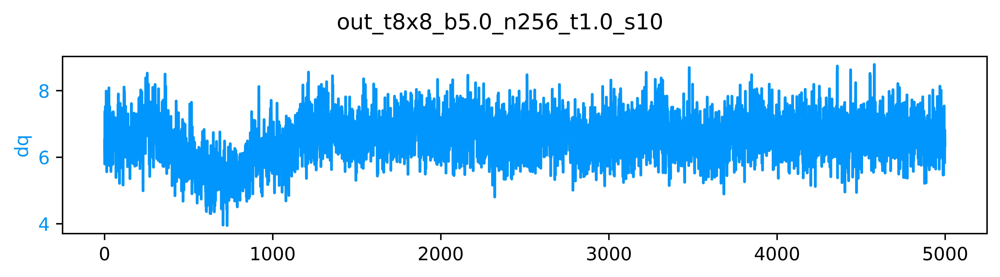

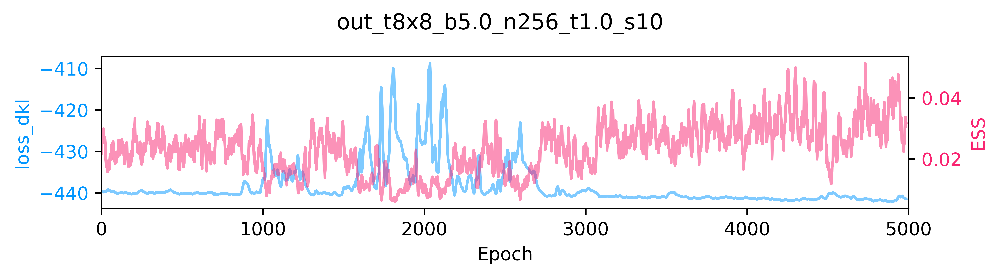

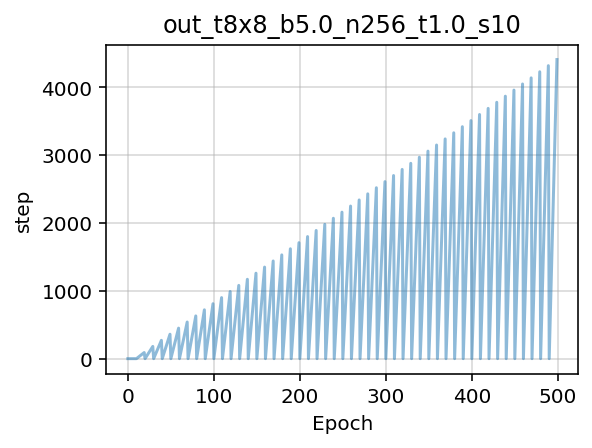

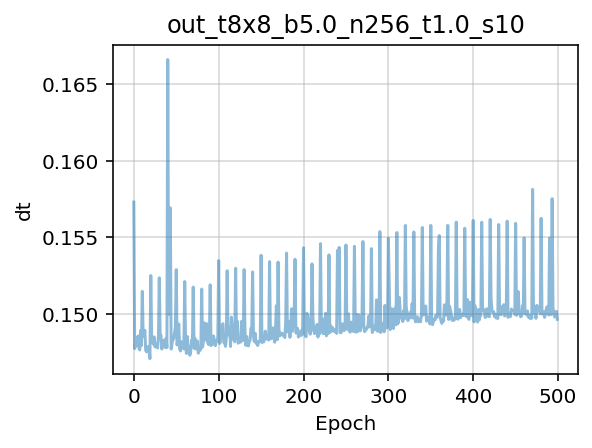

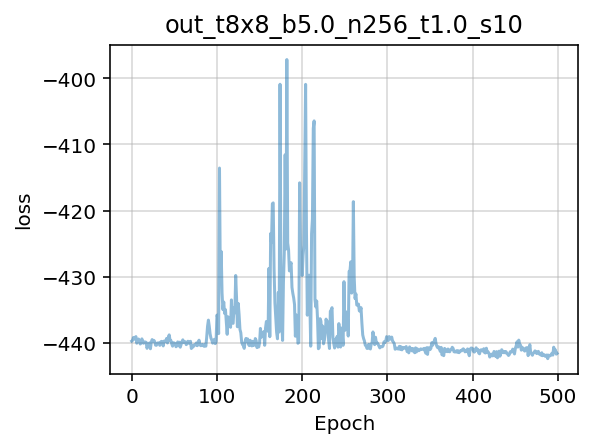

...

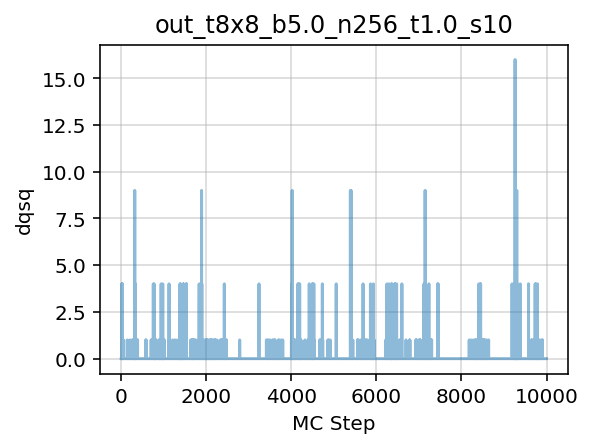

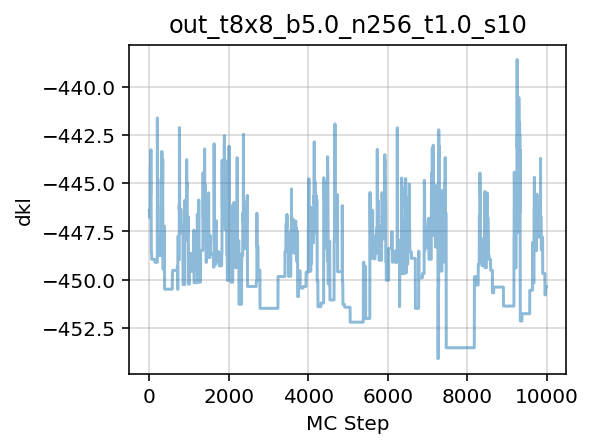

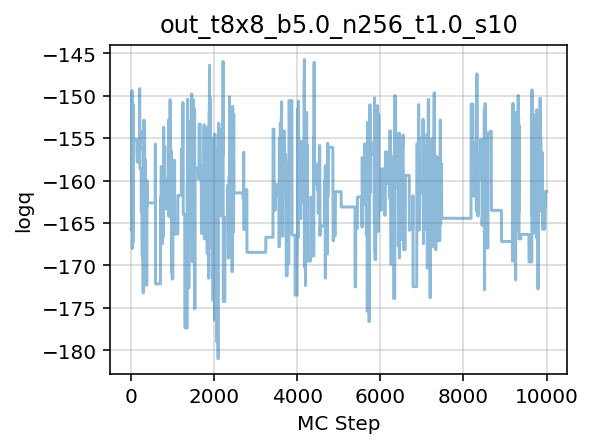

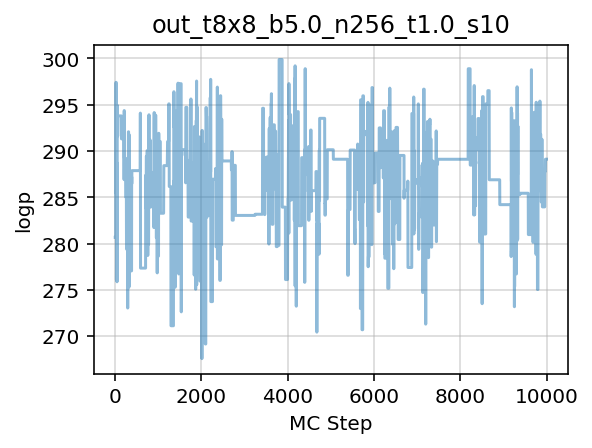

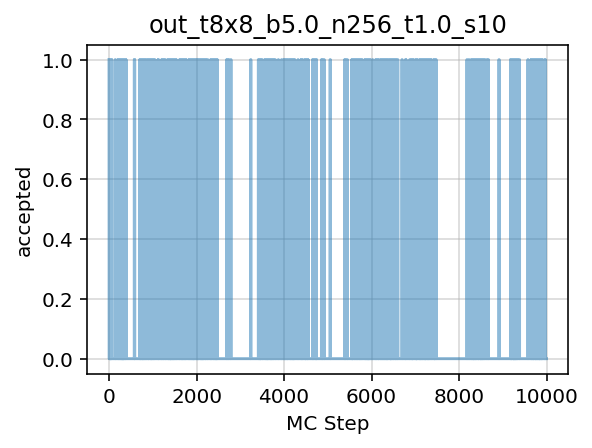

In [17]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 5.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
})

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))

train_config8 = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 100,
    'n_layers': 24,
     'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

In [18]:
logger.log(repr(param))

[17:49:07]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

In [19]:
logger.log(train_config)

            TrainConfig(                                                                     
                n_era=50,                                                                    
                n_epoch=100,                                                                 
                n_layers=24,                                                                 
                n_s_nets=2,                                                                  
                hidden_sizes=[8, 8],                                                         
                kernel_size=5,                                                               
                base_lr=0.001,                                                               
                batch_size=256,                                                              
                print_freq=100,                                                              
                plot_freq=100,                                                               
                with_force=False                                                             
            )

In [20]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = Param(**{
    'L': 12,
    'tau': 1.,
    'nrun': 5,
    'beta': 5.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
})

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 100,
    'n_layers': 24,
     'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})


prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [21]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

[17:53:01]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10

[17:53:01]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10/models

[17:53:01]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10/metrics

[17:53:01]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10/plots

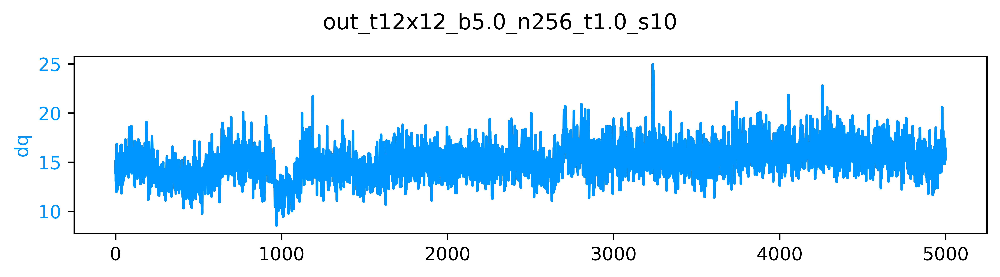

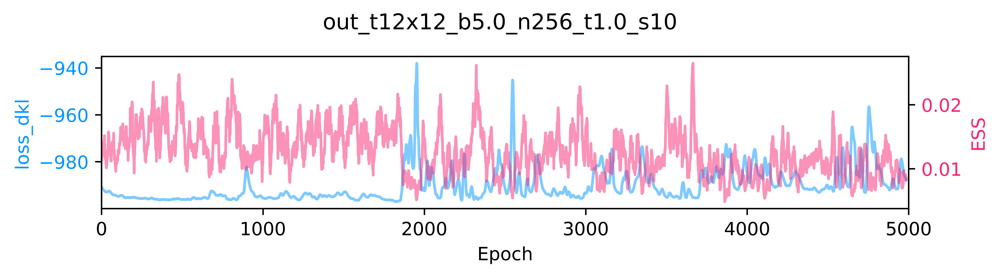

[17:53:05]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:53:20]  epoch=97.000 step=0.000 dt=0.151 loss=-994.306 dq=16.3594 ess=0.00998254         
            plaq=0.879817 loss_dkl=-994.306 logp=633.468 logq=-360.838

[17:53:22]  ---------------------------------------                                          
            ERA=1, last took: 0 min 17.11 s                                                  
            ---------------------------------------

[17:53:38]  epoch=97.000 step=97.000 dt=0.152 loss=-995.189 dq=14.0789 ess=0.0162765         
            plaq=0.875987 loss_dkl=-995.189 logp=630.711 logq=-364.478

[17:53:40]  ---------------------------------------                                          
            ERA=2, last took: 0 min 17.25 s                                                  
            ---------------------------------------

[17:53:55]  epoch=97.000 step=194.000 dt=0.152 loss=-996.045 dq=13.3664 ess=0.0155583        
            plaq=0.879005 loss_dkl=-996.045 logp=632.884 logq=-363.161

[17:53:57]  ---------------------------------------                                          
            ERA=3, last took: 0 min 17.2 s                                                   
            ---------------------------------------

[17:54:12]  epoch=97.000 step=291.000 dt=0.151 loss=-995.983 dq=13.9008 ess=0.014436         
            plaq=0.878009 loss_dkl=-995.983 logp=632.166 logq=-363.816

[17:54:14]  ---------------------------------------                                          
            ERA=4, last took: 0 min 17.23 s                                                  
            ---------------------------------------

[17:54:29]  epoch=97.000 step=388.000 dt=0.152 loss=-996.255 dq=13.5625 ess=0.0123724        
            plaq=0.880914 loss_dkl=-996.255 logp=634.258 logq=-361.998

[17:54:31]  ---------------------------------------                                          
            ERA=5, last took: 0 min 17.25 s                                                  
            ---------------------------------------

[17:54:47]  epoch=97.000 step=485.000 dt=0.152 loss=-995.867 dq=13.4375 ess=0.0093507        
            plaq=0.87988 loss_dkl=-995.867 logp=633.514 logq=-362.353

[17:54:48]  ---------------------------------------                                          
            ERA=6, last took: 0 min 17.26 s                                                  
            ---------------------------------------

[17:55:04]  epoch=97.000 step=582.000 dt=0.152 loss=-993.006 dq=15.9047 ess=0.0091564        
            plaq=0.885034 loss_dkl=-993.006 logp=637.224 logq=-355.781

[17:55:06]  ---------------------------------------                                          
            ERA=7, last took: 0 min 17.37 s                                                  
            ---------------------------------------

[17:55:21]  epoch=97.000 step=679.000 dt=0.152 loss=-995.936 dq=15.7648 ess=0.013377         
            plaq=0.876466 loss_dkl=-995.936 logp=631.056 logq=-364.88

[17:55:23]  ---------------------------------------                                          
            ERA=8, last took: 0 min 17.34 s                                                  
            ---------------------------------------

[17:55:39]  epoch=97.000 step=776.000 dt=0.152 loss=-986.401 dq=13.2273 ess=0.00909867       
            plaq=0.877048 loss_dkl=-986.401 logp=631.474 logq=-354.927

[17:55:41]  ---------------------------------------                                          
            ERA=9, last took: 0 min 17.36 s                                                  
            ---------------------------------------

[17:55:56]  epoch=97.000 step=873.000 dt=0.152 loss=-994.619 dq=12.0391 ess=0.00580752       
            plaq=0.881536 loss_dkl=-994.619 logp=634.706 logq=-359.913

[17:55:58]  ---------------------------------------                                          
            ERA=10, last took: 0 min 17.35 s                                                 
            ---------------------------------------

[17:56:13]  epoch=97.000 step=970.000 dt=0.152 loss=-995.355 dq=13.4078 ess=0.011818         
            plaq=0.883757 loss_dkl=-995.355 logp=636.305 logq=-359.049

[17:56:15]  ---------------------------------------                                          
            ERA=11, last took: 0 min 17.46 s                                                 
            ---------------------------------------

[17:56:31]  epoch=97.000 step=1067.000 dt=0.153 loss=-994.465 dq=14.7063 ess=0.0144992       
            plaq=0.879948 loss_dkl=-994.465 logp=633.562 logq=-360.903

[17:56:33]  ---------------------------------------                                          
            ERA=12, last took: 0 min 17.4 s                                                  
            ---------------------------------------

[17:56:48]  epoch=97.000 step=1164.000 dt=0.152 loss=-993.238 dq=14.3711 ess=0.00912731      
            plaq=0.88356 loss_dkl=-993.238 logp=636.163 logq=-357.075

[17:56:50]  ---------------------------------------                                          
            ERA=13, last took: 0 min 17.41 s                                                 
            ---------------------------------------

[17:57:06]  epoch=97.000 step=1261.000 dt=0.152 loss=-995.026 dq=14.5039 ess=0.0212752       
            plaq=0.878979 loss_dkl=-995.026 logp=632.865 logq=-362.161

[17:57:08]  ---------------------------------------                                          
            ERA=14, last took: 0 min 17.39 s                                                 
            ---------------------------------------

[17:57:23]  epoch=97.000 step=1358.000 dt=0.152 loss=-994.091 dq=13.5719 ess=0.0168376       
            plaq=0.881043 loss_dkl=-994.091 logp=634.351 logq=-359.739

[17:57:25]  ---------------------------------------                                          
            ERA=15, last took: 0 min 17.42 s                                                 
            ---------------------------------------

[17:57:40]  epoch=97.000 step=1455.000 dt=0.153 loss=-996.32 dq=13.7773 ess=0.0122021        
            plaq=0.883392 loss_dkl=-996.32 logp=636.042 logq=-360.278

[17:57:42]  ---------------------------------------                                          
            ERA=16, last took: 0 min 17.47 s                                                 
            ---------------------------------------

[17:57:58]  epoch=97.000 step=1552.000 dt=0.153 loss=-994.201 dq=16.0805 ess=0.0170361       
            plaq=0.881507 loss_dkl=-994.201 logp=634.685 logq=-359.516

[17:58:00]  ---------------------------------------                                          
            ERA=17, last took: 0 min 17.47 s                                                 
            ---------------------------------------

[17:58:15]  epoch=97.000 step=1649.000 dt=0.153 loss=-996.354 dq=14.2711 ess=0.0143691       
            plaq=0.882768 loss_dkl=-996.354 logp=635.593 logq=-360.761

[17:58:17]  ---------------------------------------                                          
            ERA=18, last took: 0 min 17.46 s                                                 
            ---------------------------------------

[17:58:33]  epoch=97.000 step=1746.000 dt=0.152 loss=-973.843 dq=15.1484 ess=0.00636622      
            plaq=0.881119 loss_dkl=-973.843 logp=634.406 logq=-339.437

[17:58:35]  ---------------------------------------                                          
            ERA=19, last took: 0 min 17.46 s                                                 
            ---------------------------------------

[17:58:50]  epoch=97.000 step=1843.000 dt=0.153 loss=-991.404 dq=15.5422 ess=0.0141452       
            plaq=0.881753 loss_dkl=-991.404 logp=634.862 logq=-356.542

[17:58:52]  ---------------------------------------                                          
            ERA=20, last took: 0 min 17.42 s                                                 
            ---------------------------------------

[17:59:08]  epoch=97.000 step=1940.000 dt=0.152 loss=-995.682 dq=15.182 ess=0.0135554        
            plaq=0.881677 loss_dkl=-995.682 logp=634.808 logq=-360.874

[17:59:10]  ---------------------------------------                                          
            ERA=21, last took: 0 min 17.42 s                                                 
            ---------------------------------------

[17:59:25]  epoch=97.000 step=2037.000 dt=0.153 loss=-994.725 dq=15.1055 ess=0.0191071       
            plaq=0.884457 loss_dkl=-994.725 logp=636.809 logq=-357.916

[17:59:27]  ---------------------------------------                                          
            ERA=22, last took: 0 min 17.45 s                                                 
            ---------------------------------------

[17:59:43]  epoch=97.000 step=2134.000 dt=0.152 loss=-989.602 dq=14.6953 ess=0.00836254      
            plaq=0.882715 loss_dkl=-989.602 logp=635.555 logq=-354.047

[17:59:45]  ---------------------------------------                                          
            ERA=23, last took: 0 min 17.45 s                                                 
            ---------------------------------------

[18:00:00]  epoch=97.000 step=2231.000 dt=0.152 loss=-987.957 dq=15.1047 ess=0.00945519      
            plaq=0.879938 loss_dkl=-987.957 logp=633.555 logq=-354.402

[18:00:02]  ---------------------------------------                                          
            ERA=24, last took: 0 min 17.45 s                                                 
            ---------------------------------------

[18:00:17]  epoch=97.000 step=2328.000 dt=0.153 loss=-988.883 dq=15.3211 ess=0.00905773      
            plaq=0.880093 loss_dkl=-988.883 logp=633.667 logq=-355.216

[18:00:19]  ---------------------------------------                                          
            ERA=25, last took: 0 min 17.43 s                                                 
            ---------------------------------------

[18:00:35]  epoch=97.000 step=2425.000 dt=0.153 loss=-983.897 dq=14.3453 ess=0.00962061      
            plaq=0.882733 loss_dkl=-983.897 logp=635.568 logq=-348.329

[18:00:37]  ---------------------------------------                                          
            ERA=26, last took: 0 min 17.46 s                                                 
            ---------------------------------------

[18:00:52]  epoch=97.000 step=2522.000 dt=0.152 loss=-977.921 dq=16.3406 ess=0.0064411       
            plaq=0.866243 loss_dkl=-977.921 logp=623.695 logq=-354.226

[18:00:54]  ---------------------------------------                                          
            ERA=27, last took: 0 min 17.47 s                                                 
            ---------------------------------------

[18:01:10]  epoch=97.000 step=2619.000 dt=0.153 loss=-994.415 dq=16.1445 ess=0.0131283       
            plaq=0.881376 loss_dkl=-994.415 logp=634.591 logq=-359.824

[18:01:12]  ---------------------------------------                                          
            ERA=28, last took: 0 min 17.59 s                                                 
            ---------------------------------------

[18:01:27]  epoch=97.000 step=2716.000 dt=0.153 loss=-993.786 dq=16.0922 ess=0.0125494       
            plaq=0.880154 loss_dkl=-993.786 logp=633.711 logq=-360.075

[18:01:30]  ---------------------------------------                                          
            ERA=29, last took: 0 min 17.56 s                                                 
            ---------------------------------------

[18:01:45]  epoch=97.000 step=2813.000 dt=0.152 loss=-994.338 dq=16.3094 ess=0.0102855       
            plaq=0.880564 loss_dkl=-994.338 logp=634.006 logq=-360.332

[18:01:47]  ---------------------------------------                                          
            ERA=30, last took: 0 min 17.51 s                                                 
            ---------------------------------------

[18:02:02]  epoch=97.000 step=2910.000 dt=0.152 loss=-980.372 dq=14.7141 ess=0.00468644      
            plaq=0.881805 loss_dkl=-980.372 logp=634.9 logq=-345.472

[18:02:05]  ---------------------------------------                                          
            ERA=31, last took: 0 min 17.51 s                                                 
            ---------------------------------------

[18:02:20]  epoch=97.000 step=3007.000 dt=0.153 loss=-992.745 dq=15.007 ess=0.00792104       
            plaq=0.881784 loss_dkl=-992.745 logp=634.885 logq=-357.861

[18:02:22]  ---------------------------------------                                          
            ERA=32, last took: 0 min 17.56 s                                                 
            ---------------------------------------

[18:02:38]  epoch=97.000 step=3104.000 dt=0.153 loss=-992.701 dq=14.8086 ess=0.0116944       
            plaq=0.883998 loss_dkl=-992.701 logp=636.478 logq=-356.223

[18:02:40]  ---------------------------------------                                          
            ERA=33, last took: 0 min 17.53 s                                                 
            ---------------------------------------

[18:02:55]  epoch=97.000 step=3201.000 dt=0.153 loss=-988.901 dq=16.482 ess=0.00681979       
            plaq=0.879516 loss_dkl=-988.901 logp=633.252 logq=-355.65

[18:02:57]  ---------------------------------------                                          
            ERA=34, last took: 0 min 17.56 s                                                 
            ---------------------------------------

[18:03:13]  epoch=97.000 step=3298.000 dt=0.153 loss=-994.815 dq=15.2898 ess=0.0126729       
            plaq=0.882351 loss_dkl=-994.815 logp=635.292 logq=-359.523

[18:03:15]  ---------------------------------------                                          
            ERA=35, last took: 0 min 17.53 s                                                 
            ---------------------------------------

[18:03:30]  epoch=97.000 step=3395.000 dt=0.153 loss=-995.153 dq=16.1867 ess=0.0199637       
            plaq=0.884831 loss_dkl=-995.153 logp=637.078 logq=-358.075

[18:03:32]  ---------------------------------------                                          
            ERA=36, last took: 0 min 17.6 s                                                  
            ---------------------------------------

[18:03:48]  epoch=97.000 step=3492.000 dt=0.153 loss=-995.525 dq=14.8211 ess=0.0132783       
            plaq=0.882556 loss_dkl=-995.525 logp=635.44 logq=-360.085

[18:03:50]  ---------------------------------------                                          
            ERA=37, last took: 0 min 17.57 s                                                 
            ---------------------------------------

[18:04:05]  epoch=97.000 step=3589.000 dt=0.153 loss=-989.616 dq=15.5109 ess=0.0108854       
            plaq=0.873286 loss_dkl=-989.616 logp=628.766 logq=-360.85

[18:04:07]  ---------------------------------------                                          
            ERA=38, last took: 0 min 17.55 s                                                 
            ---------------------------------------

[18:04:23]  epoch=97.000 step=3686.000 dt=0.153 loss=-974.26 dq=15.443 ess=0.00678273        
            plaq=0.877833 loss_dkl=-974.26 logp=632.039 logq=-342.221

[18:04:25]  ---------------------------------------                                          
            ERA=39, last took: 0 min 17.57 s                                                 
            ---------------------------------------

[18:04:40]  epoch=97.000 step=3783.000 dt=0.153 loss=-976.54 dq=16.525 ess=0.00640256        
            plaq=0.861708 loss_dkl=-976.54 logp=620.43 logq=-356.11

[18:04:43]  ---------------------------------------                                          
            ERA=40, last took: 0 min 17.6 s                                                  
            ---------------------------------------

[18:04:58]  epoch=97.000 step=3880.000 dt=0.153 loss=-987.356 dq=15.6383 ess=0.0106068       
            plaq=0.875534 loss_dkl=-987.356 logp=630.385 logq=-356.972

[18:05:00]  ---------------------------------------                                          
            ERA=41, last took: 0 min 17.59 s                                                 
            ---------------------------------------

[18:05:16]  epoch=97.000 step=3977.000 dt=0.153 loss=-991.06 dq=16.3539 ess=0.00624569       
            plaq=0.876541 loss_dkl=-991.06 logp=631.109 logq=-359.951

[18:05:18]  ---------------------------------------                                          
            ERA=42, last took: 0 min 17.61 s                                                 
            ---------------------------------------

[18:05:33]  epoch=97.000 step=4074.000 dt=0.153 loss=-986.025 dq=16.6367 ess=0.0125875       
            plaq=0.877362 loss_dkl=-986.025 logp=631.701 logq=-354.324

[18:05:35]  ---------------------------------------                                          
            ERA=43, last took: 0 min 17.64 s                                                 
            ---------------------------------------

[18:05:51]  epoch=97.000 step=4171.000 dt=0.153 loss=-992.167 dq=16.4945 ess=0.012084        
            plaq=0.881039 loss_dkl=-992.167 logp=634.348 logq=-357.819

[18:05:53]  ---------------------------------------                                          
            ERA=44, last took: 0 min 17.67 s                                                 
            ---------------------------------------

[18:06:09]  epoch=97.000 step=4268.000 dt=0.152 loss=-990.307 dq=16.0781 ess=0.00996362      
            plaq=0.881298 loss_dkl=-990.307 logp=634.535 logq=-355.772

[18:06:11]  ---------------------------------------                                          
            ERA=45, last took: 0 min 17.62 s                                                 
            ---------------------------------------

[18:06:26]  epoch=97.000 step=4365.000 dt=0.153 loss=-970.942 dq=15.293 ess=0.00765899       
            plaq=0.877143 loss_dkl=-970.942 logp=631.543 logq=-339.399

[18:06:28]  ---------------------------------------                                          
            ERA=46, last took: 0 min 17.63 s                                                 
            ---------------------------------------

[18:06:44]  epoch=97.000 step=4462.000 dt=0.153 loss=-984.456 dq=16.1375 ess=0.00622715      
            plaq=0.879041 loss_dkl=-984.456 logp=632.909 logq=-351.547

[18:06:46]  ---------------------------------------                                          
            ERA=47, last took: 0 min 17.69 s                                                 
            ---------------------------------------

[18:07:02]  epoch=97.000 step=4559.000 dt=0.153 loss=-965.575 dq=14.8961 ess=0.00473703      
            plaq=0.878449 loss_dkl=-965.575 logp=632.483 logq=-333.091

[18:07:04]  ---------------------------------------                                          
            ERA=48, last took: 0 min 17.68 s                                                 
            ---------------------------------------

[18:07:19]  epoch=97.000 step=4656.000 dt=0.153 loss=-991.213 dq=14.5242 ess=0.0100705       
            plaq=0.880583 loss_dkl=-991.213 logp=634.02 logq=-357.193

[18:07:21]  ---------------------------------------                                          
            ERA=49, last took: 0 min 17.7 s                                                  
            ---------------------------------------

[18:07:37]  epoch=97.000 step=4753.000 dt=0.152 loss=-989.537 dq=16.0016 ess=0.0116741       
            plaq=0.881437 loss_dkl=-989.537 logp=634.635 logq=-354.902

[18:07:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1753

[18:07:39]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t12x12_b5.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1753/pre_flow
            _model.tar

[18:07:40]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t12x12_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1753

[18:07:40]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t12x12_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1753/dq_t
            raining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t12x12_b5.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1753/loss
            _dkl_ess_training.pdf

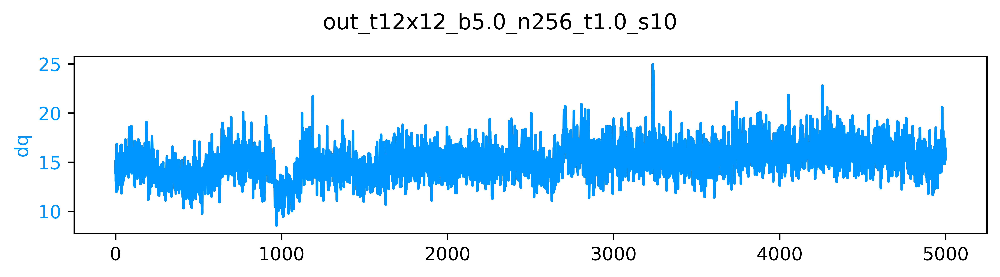

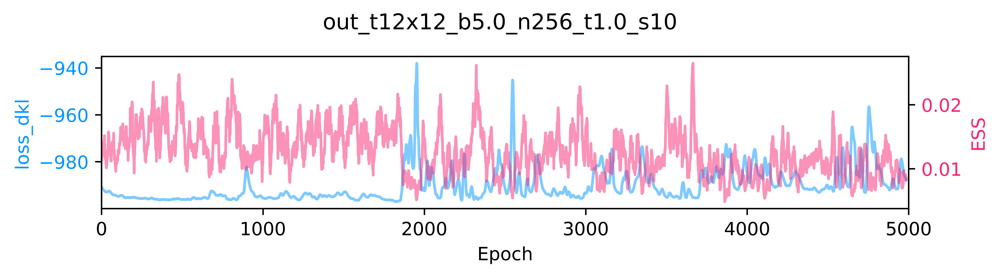

In [22]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))